# CSDA Evaluation Sites overview

| Author | Affiliation | Date |
| ---------------- | ---------------- | ---------------- |
| Paul Montesano, PhD | Innovation Lab ; NASA Goddard Space Flight Center | Aug. 2025 |

In [1]:
library(ggplot2)
library(sf)
library(tidyverse)
library(ggrepel)
library(RColorBrewer)

Warning message:
“package ‘ggplot2’ was built under R version 4.4.3”
Linking to GEOS 3.12.2, GDAL 3.9.1, PROJ 9.4.1; sf_use_s2() is TRUE

Warning message:
“package ‘tidyverse’ was built under R version 4.4.3”
Warning message:
“package ‘tibble’ was built under R version 4.4.3”
Warning message:
“package ‘tidyr’ was built under R version 4.4.3”
Warning message:
“package ‘readr’ was built under R version 4.4.3”
Warning message:
“package ‘purrr’ was built under R version 4.4.3”
Warning message:
“package ‘dplyr’ was built under R version 4.4.3”
Warning message:
“package ‘stringr’ was built under R version 4.4.3”
Warning message:
“package ‘forcats’ was built under R version 4.4.3”
Warning message:
“package ‘lubridate’ was built under R version 4.4.3”
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.2.1     ✔ readr     2.2.0
✔ forcats   1.0.1     ✔ stringr   1.6.0
✔ lubridate 1.9.5     ✔ tibble    3.3.1
✔ purrr     1.2.2     ✔ tidyr     1.3.2
── Co

In [2]:
# library(rnaturalearth)
# library(rnaturalearthdata)

In [3]:
SHEET_NAME <- 'Evaluation Sites'
SPREADSHEET_ID = '13MrpqFtAOqQY9WdW9lHNsqjCbG-e3VQkEDbHOGIKa6k'

# URL encode using base R
ENCODED_SHEET_NAME <- URLencode(SHEET_NAME, reserved = TRUE)

# Construct URL
url <- paste0("https://docs.google.com/spreadsheets/d/", SPREADSHEET_ID, 
              "/gviz/tq?tqx=out:csv&sheet=", ENCODED_SHEET_NAME)

# Read and process
tryCatch({
    sites_df <- read.csv(url, stringsAsFactors = FALSE) %>% 
        select(-starts_with("X"))
    sites_df$Site.Name <- trimws(sites_df$Site.Name, which = "right")
    
}, error = function(e) {
    message("An error occurred: ", e$message)
})

colnames(sites_df)

[1] "Site.Name.abbrev"      "Site.Name"             "Location.Name"        
 [4] "Country"               "Program.Use"           "Longitude"            
 [7] "Latitude"              "Remote.Sensing.Domain" "Priority.Level"       
[10] "Evaluation.Category"   "Source"                "Surface.Domain"       
[13] "Assessment.type.s."    "Resolution.Category"   "aoi_type"             
[16] "aoi_size_km"           "max_view_angle"        "min_num_acqs"         
[19] "max_cloud_pct"         "contact"               "reference"            
[22] "notes"                 "Column.1"              "Column.2"             
[25] "Column.3"              "Column.4"              "Column.5"             
[28] "Column.6"              "Column.7"              "Column.8"             
[31] "Column.9"              "Column.10"             "Column.11"            
[34] "Column.12"             "Column.13"

In [4]:
#sites_df = read_csv('/projects/my-private-bucket/databank/csda/CSDA SME Evaluation Sites(SME sites).csv')

In [7]:
# Convert to sf object
sites_sf <- st_as_sf(sites_df %>% 
                     filter(
                         !is.na(`Longitude`),
                         !is.na(`Evaluation.Category`),
                     ), 
                     #coords = c('Longitude (deg)', 'Latitude (deg)'), crs = 4326)
                     coords = c('Longitude', 'Latitude'), crs = 4326)

# Set CRS using WKT2 string to bypass PROJ database
wgs84_wkt <- 'GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433]]'
sites_sf <- st_set_crs(sites_sf, 4326)

# # Add continent info from world data
# sites_with_continent <- st_join(sites_sf, world %>% select(continent))
# sites_proj <- st_transform(sites_with_continent, crs = proj)

In [8]:
continents <- st_read('/explore/nobackup/people/pmontesa/userfs02/arc/continents.shp')
head(continents)

Reading layer `continents' from data source 
  `/panfs/ccds02/nobackup/people/pmontesa/userfs02/arc/continents.shp' 
  using driver `ESRI Shapefile'
Simple feature collection with 8 features and 1 field
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -180 ymin: -90 xmax: 180 ymax: 83.6236
Geodetic CRS:  WGS 84


Registered S3 method overwritten by 'geojsonsf':
  method        from   
  print.geojson geojson



,CONTINENT,geometry
,<chr>,<MULTIPOLYGON [°]>
1,Asia,MULTIPOLYGON (((93.27554 80...
2,North America,MULTIPOLYGON (((-25.28167 7...
3,Europe,MULTIPOLYGON (((58.06138 81...
4,Africa,MULTIPOLYGON (((0.694651 5....
5,South America,MULTIPOLYGON (((-81.71306 1...
6,Oceania,MULTIPOLYGON (((-177.3933 2...


In [9]:
world <- st_read('/explore/nobackup/people/pmontesa/userfs02/arc/continents.shp')
sites_sf_continents <- st_join(sites_sf, world, left = TRUE)

Reading layer `continents' from data source 
  `/panfs/ccds02/nobackup/people/pmontesa/userfs02/arc/continents.shp' 
  using driver `ESRI Shapefile'
Simple feature collection with 8 features and 1 field
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -180 ymin: -90 xmax: 180 ymax: 83.6236
Geodetic CRS:  WGS 84


In [10]:
# Try to get ne_countries, fallback to local file if not available
tryCatch({
  world <- ne_countries(scale = "medium", returnclass = "sf")
  sites_sf_continents <- st_join(sites_sf, world, left = TRUE)
}, error = function(e) {
  message("ne_countries not available, reading from local file...")

})

#world <<- st_read('/explore/nobackup/people/pmontesa/userfs02/arc/natural_earth/10m_physical/ne_10m_land.shp')
world <- st_read('/explore/nobackup/people/pmontesa/userfs02/arc/continents.shp')
sites_sf_continents <- st_join(sites_sf, world, left = TRUE)

# Store the original CRS
original_crs <- st_crs(world)
if (is.na(original_crs)) original_crs <- 4326

# Define orthographic projection (centered on 0°, 0°)
ortho_proj <- "+proj=ortho +lon_0=0 +lat_0=30 +ellps=WGS84 +datum=WGS84 +units=m +no_defs"
eckert6_proj <- "+proj=eck6 +lon_0=0 +x_0=0 +y_0=0 +ellps=WGS84 +datum=WGS84 +units=m +no_defs"

proj = eckert6_proj

world_proj <- world %>%
  st_set_crs(original_crs) %>%
  st_cast('MULTILINESTRING') %>%
  st_set_crs(original_crs) %>%
  st_cast('LINESTRING', do_split = TRUE) %>%
  st_set_crs(original_crs) %>%
  st_transform(crs = proj) %>%
  st_cast('POLYGON')

ne_countries not available, reading from local file...



Reading layer `continents' from data source 
  `/panfs/ccds02/nobackup/people/pmontesa/userfs02/arc/continents.shp' 
  using driver `ESRI Shapefile'
Simple feature collection with 8 features and 1 field
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -180 ymin: -90 xmax: 180 ymax: 83.6236
Geodetic CRS:  WGS 84


Warning message in st_cast.sf(., "LINESTRING", do_split = TRUE):
“repeating attributes for all sub-geometries for which they may not be constant”


In [11]:
# world <- st_read('/explore/nobackup/people/pmontesa/userfs02/arc/continents.shp')

In [12]:
sites_sf_continents <- st_join(sites_sf, world, left = TRUE)

In [13]:
# Transform data to projection
sites_proj <- st_transform(sites_sf_continents, crs = proj)

In [14]:
# Create a circle to represent the globe edge
earth_radius <- 6371000

# Create center point in geographic coordinates, then transform
center_point <- st_sfc(st_point(c(0, 0)), crs = wgs84_wkt) %>%
  st_transform(crs = proj)

globe_edge <- st_buffer(center_point, earth_radius)
globe_edge_sf <- st_sf(geometry = globe_edge)

In [46]:
# Create graticule (grid lines)
graticule <- st_graticule(lat = seq(-90, 90, 30), lon = seq(-180, 180, 30))
graticule_proj <- st_transform(graticule, crs = proj)

graticule_with_continent <- st_join(graticule, world, left = FALSE)
graticule_proj <- st_transform(graticule_with_continent, crs = proj)

# Create the plot
base_map = ggplot() +
  # # First, draw the globe background (white circle)
  # geom_sf(data = globe_edge_sf, fill = "white", color = "black", size = 0.5) +
  # Optional: Add graticule for reference
  geom_sf(data = graticule_proj, color = "lightgray", size = 0.2, alpha = 0.5) +
  # Then add the continents
  geom_sf(data = world_proj, fill = "gray90", color = "gray90", size = 0.1) +
  theme_void() +
  theme(
    panel.background = element_rect(fill = "white", color = NA),
    plot.background = element_rect(fill = "white", color = NA),
    legend.text = element_text(size=6),
    legend.title = element_text(size=7),
    legend.position = "top",
    legend.direction = "vertical",  # Changed to vertical
    legend.box = "vertical"          # Added this
    #legend.spacing.y = unit(0.01, "cm") 
  ) +
  #labs(title = "Site Locations - Orthographic Projection") +
  coord_sf(crs = proj) 


In [47]:
colnames(sites_proj)
length(levels(factor(sites_proj$Source)))

[1] "Site.Name.abbrev"      "Site.Name"             "Location.Name"        
 [4] "Country"               "Program.Use"           "Remote.Sensing.Domain"
 [7] "Priority.Level"        "Evaluation.Category"   "Source"               
[10] "Surface.Domain"        "Assessment.type.s."    "Resolution.Category"  
[13] "aoi_type"              "aoi_size_km"           "max_view_angle"       
[16] "min_num_acqs"          "max_cloud_pct"         "contact"              
[19] "reference"             "notes"                 "Column.1"             
[22] "Column.2"              "Column.3"              "Column.4"             
[25] "Column.5"              "Column.6"              "Column.7"             
[28] "Column.8"              "Column.9"              "Column.10"            
[31] "Column.11"             "Column.12"             "Column.13"            
[34] "CONTINENT"             "geometry"

[1] 15

In [48]:
# Get base Set1 colors (9 colors)
set1_base <- brewer.pal(9, "Set1")

# Extend by creating lighter/darker variations or repeating with alpha
extended_set1 <- colorRampPalette(set1_base)(length(levels(factor(sites_proj$Source))))

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


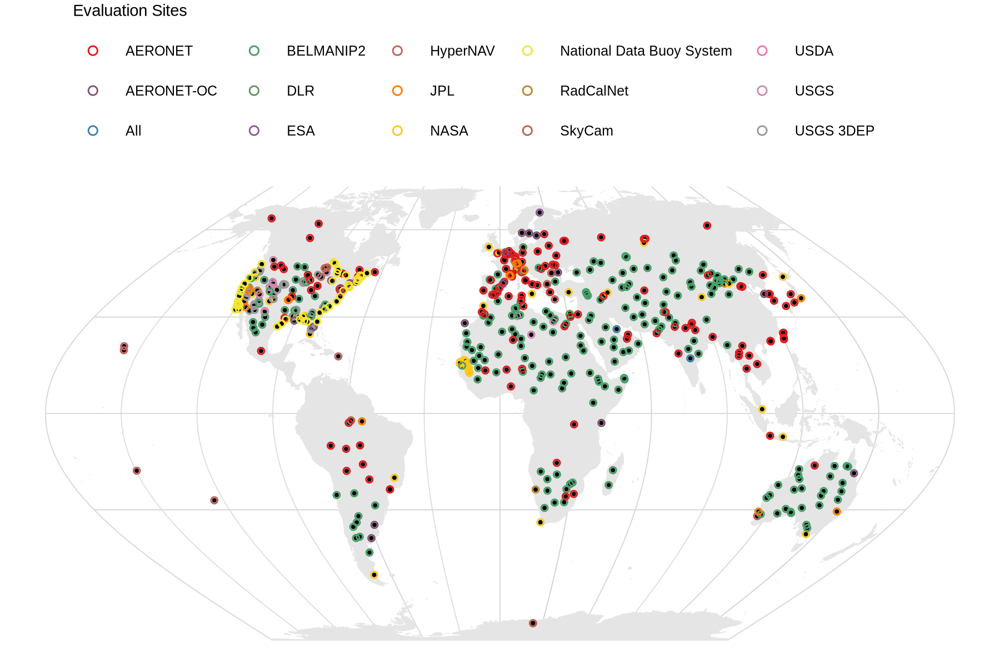

In [49]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)

base_map +   # Finally add the site points
    geom_sf(data = sites_proj , color='black', size = 0.25, shape=19) +
    geom_sf(data = sites_proj , aes(color=`Source`), size = 1, shape=1) +
    # geom_sf_label(data = sites_ortho, aes(label = `Site Name`, color=`Evaluation Category`), 
    #              nudge_x = 7e5, nudge_y = 7e5, size = 0.25) +
    #scale_color_brewer(palette = 'Set1', 
    scale_color_manual(values = extended_set1,
                       name=paste0('Evaluation Sites '),
                       guide = guide_legend(
                            ncol=6,
                            override.aes = list(
                                                size = 1.5,          # Point size
                                                label = ""         # Remove text from legend
                                                )
                                )
                        ) 

In [50]:
head(sites_proj)

Site.Name.abbrev Site.Name      Location.Name  Country Program.Use
1 Albuquerque      Albuquerque    New Mexico     USA     CSDA       
2 Baotou           Baotou         China cal/val  China   CSDA       
3 Belo Horizonte   Belo Horizonte Belo Horizonte Brazil  CSDA       
4 Boston           Boston         Massachusetts  USA     CSDA       
5 Cairo            Novosibirsk    Russia         Russia  CSDA       
6 Cairo            Konya          Turkey         Turkey  CSDA       
  Remote.Sensing.Domain Priority.Level Evaluation.Category     Source   
1 Optical Multi/Hyper   high           Geometric               NASA     
2 Optical Multi/Hyper   high           Radiometric & Geometric RadCalNet
3 Optical Multi/Hyper   high           Geometric               NASA     
4 Optical Multi/Hyper   high           Geometric               NASA     
5 Optical Multi         low            Geometric               NASA     
6 Optical Multi         low            Geometric               NASA     
  Surface.Domain geometry                  ⋯ Column.6 Column.7 Column.8
1 Land           POINT (-8968286 4367636)  ⋯ NA       NA       NA      
2 Land           POINT (8732188 5057017)   ⋯ NA       NA       NA      
3 Land           POINT (-4104901 -2501230) ⋯ NA       NA       NA      
4 Land           POINT (-5568797 5234683)  ⋯ NA       NA       NA      
5 Land           POINT (5598375 6644707)   ⋯ NA       NA       NA      
6 Land           POINT (2667331 4716889)   ⋯ NA       NA       NA      
  Column.9 Column.10 Column.11 Column.12 Column.13 CONTINENT    
1 NA       NA        NA        NA        NA        North America
2 NA       NA        NA        NA        NA        Asia         
3 NA       NA        NA        NA        NA        South America
4 NA       NA        NA        NA        NA        NA           
5 NA       NA        NA        NA        NA        Asia         
6 NA       NA        NA        NA        NA        Asia         
  geometry                 
1 POINT (-8968286 4367636) 
2 POINT (8732188 5057017)  
3 POINT (-4104901 -2501230)
4 POINT (-5568797 5234683) 
5 POINT (5598375 6644707)  
6 POINT (2667331 4716889)

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


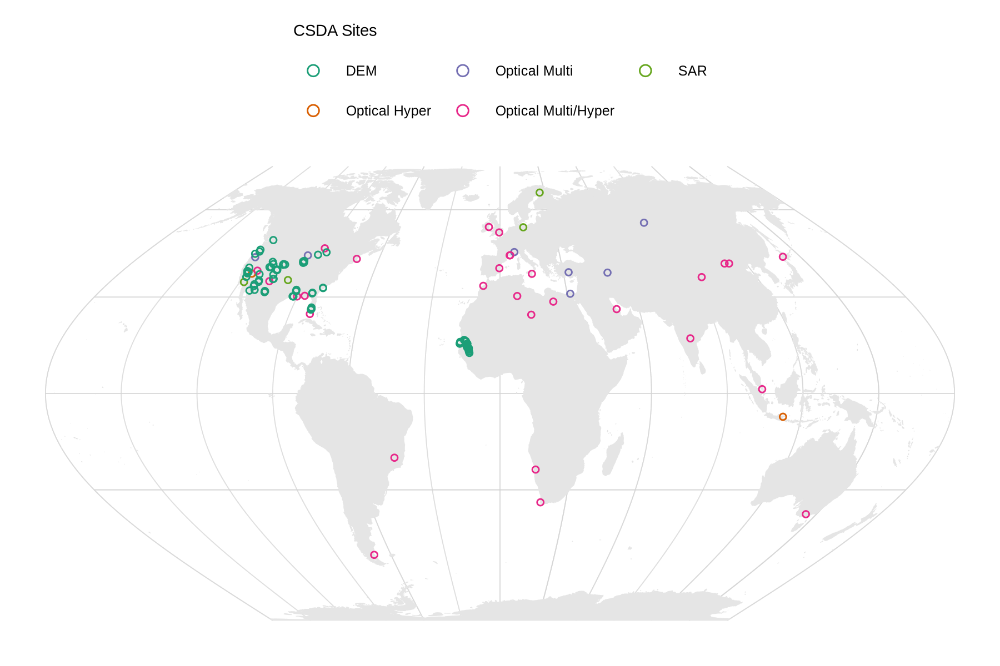

In [51]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)

base_map +   # Finally add the site points
    #geom_sf(data = sites_proj %>% filter(`Program.Use` == 'CSDA') , color='black', size = 0.25, shape=19) +
    geom_sf(data = sites_proj %>% filter(`Program.Use` == 'CSDA'), aes(color=`Remote.Sensing.Domain`), size = 1, shape=1) +
    # geom_sf_label(data = sites_ortho, aes(label = `Site Name`, color=`Evaluation Category`), 
    #              nudge_x = 7e5, nudge_y = 7e5, size = 0.25) +
    scale_color_brewer(palette = 'Dark2', name=paste0('CSDA Sites '),
                       guide = guide_legend(
                            ncol=3,
                            override.aes = list(
                                                size = 2,          # Point size
                                                label = ""         # Remove text from legend
                                                )
                                )
                        ) 

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


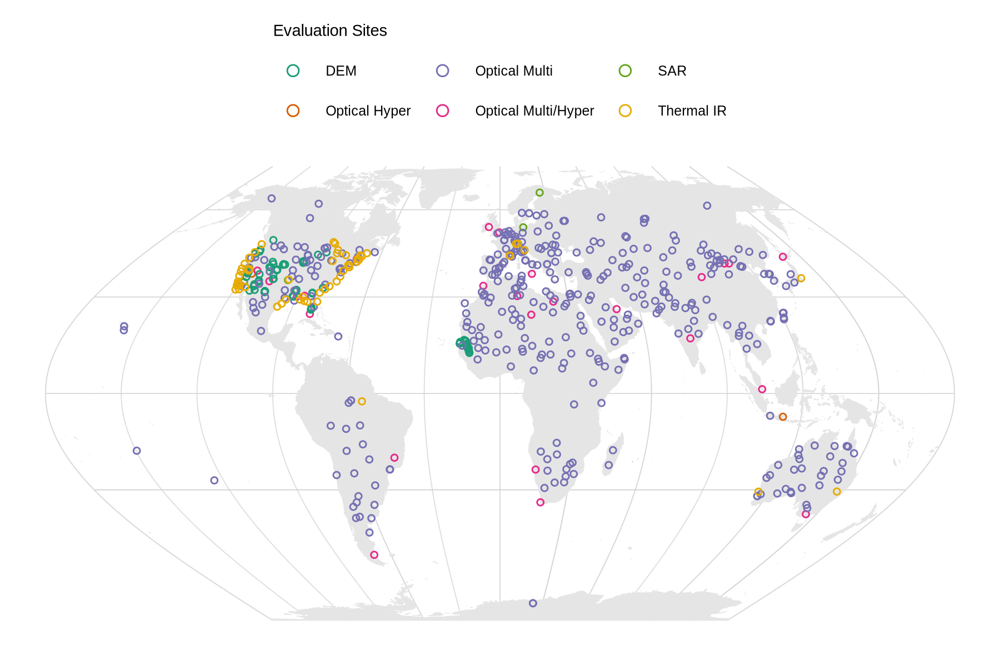

In [55]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)

base_map +   # Finally add the site points
    #geom_sf(data = sites_proj , color='black', size = 0.25, shape=19) +
    geom_sf(data = sites_proj , aes(color=`Remote.Sensing.Domain`), size = 1, shape=1) +
    # geom_sf_label(data = sites_ortho, aes(label = `Site Name`, color=`Evaluation Category`), 
    #              nudge_x = 7e5, nudge_y = 7e5, size = 0.25) +
    scale_color_brewer(palette = 'Dark2', name=paste0('Evaluation Sites '),
                       guide = guide_legend(
                            ncol=3,
                            override.aes = list(
                                                size = 2,          # Point size
                                                label = ""         # Remove text from legend
                                                )
                                )
                        ) 

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


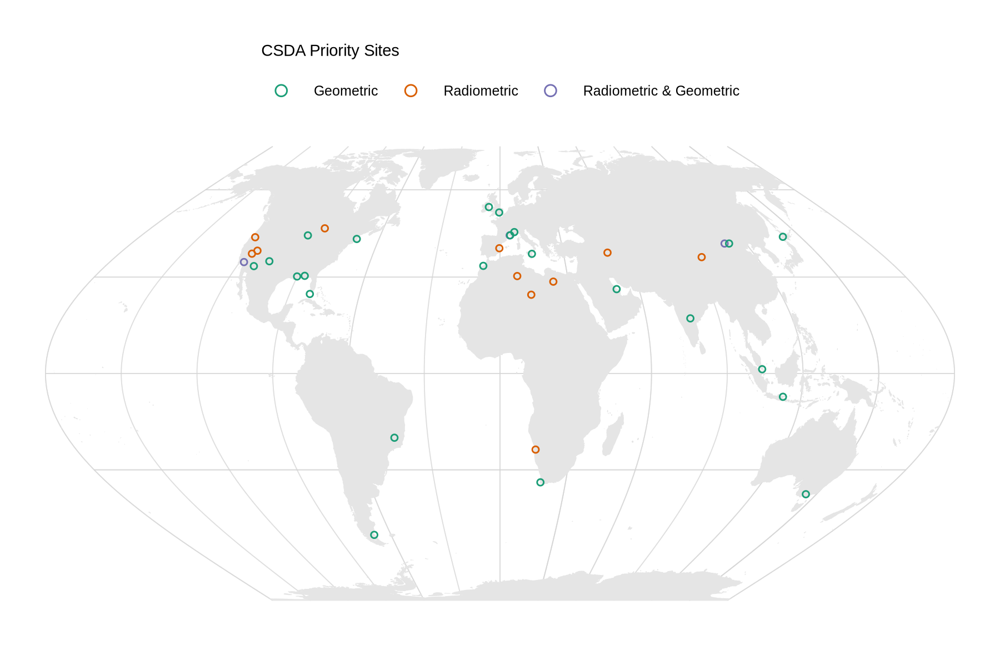

In [58]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)

base_map +   # Finally add the site points
    #geom_sf(data = sites_proj , color='black', size = 0.25, shape=19) +
    geom_sf(data = sites_proj %>% filter(`Priority.Level` == 'high'), aes(color=`Evaluation.Category`), size = 1, shape=1) +
    # geom_sf_label(data = sites_ortho, aes(label = `Site Name`, color=`Evaluation Category`), 
    #              nudge_x = 7e5, nudge_y = 7e5, size = 0.25) +
    scale_color_brewer(palette = 'Dark2', name=paste0('CSDA Priority Sites '),
                       guide = guide_legend(
                            ncol=3,
                            override.aes = list(
                                                size = 2,          # Point size
                                                label = ""         # Remove text from legend
                                                )
                                )
                        ) 

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


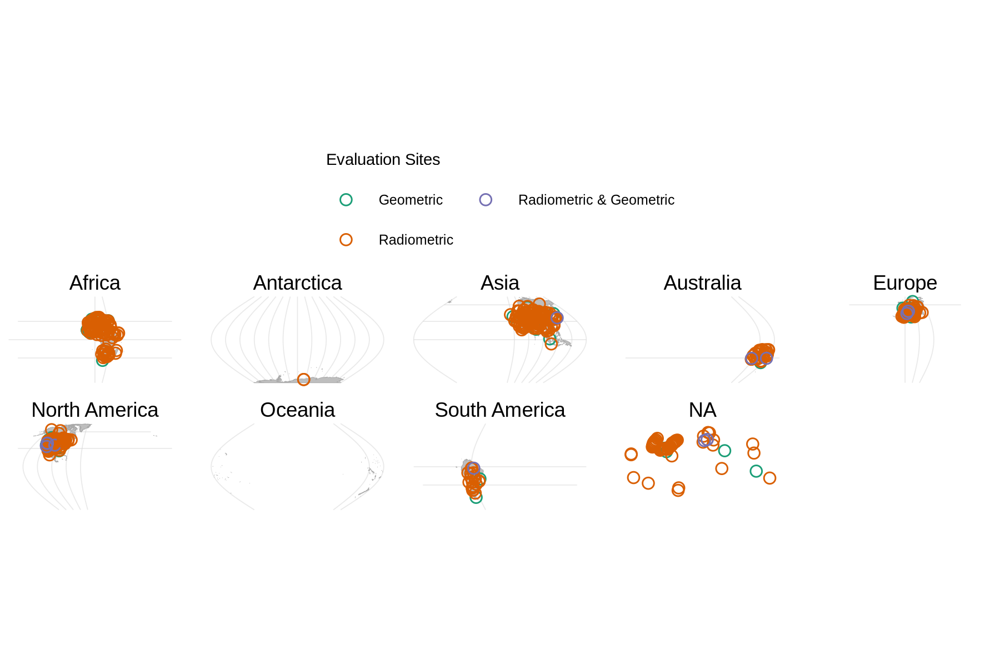

In [21]:
base_map +   # Finally add the site points
  geom_sf(data = sites_proj, aes(color=`Evaluation.Category`), size = 2, shape=1) +
  # geom_sf_label(data = sites_ortho, aes(label = `Site Name`, color=`Evaluation Category`), 
  #              nudge_x = 7e5, nudge_y = 7e5, size = 0.25) +
    scale_color_brewer(palette = 'Dark2', name=paste0('Evaluation Sites '),
                       guide = guide_legend(
                           ncol=2,
          override.aes = list(
            size = 2,          # Point size
            label = ""         # Remove text from legend
          )
        )
                      ) +
coord_sf(crs = proj) +
    facet_wrap(~CONTINENT, ncol=5)

In [22]:
site_strings <- c('Albuquerque', 'Singapore', 'Rio Gallegos', 'Libya-4','Casablanca','Catania', 'Baotou')
pattern <- paste(site_strings, collapse = "|")

sites_proj_subset = sites_proj %>% filter(grepl(pattern, `Site.Name`, ignore.case = TRUE))

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


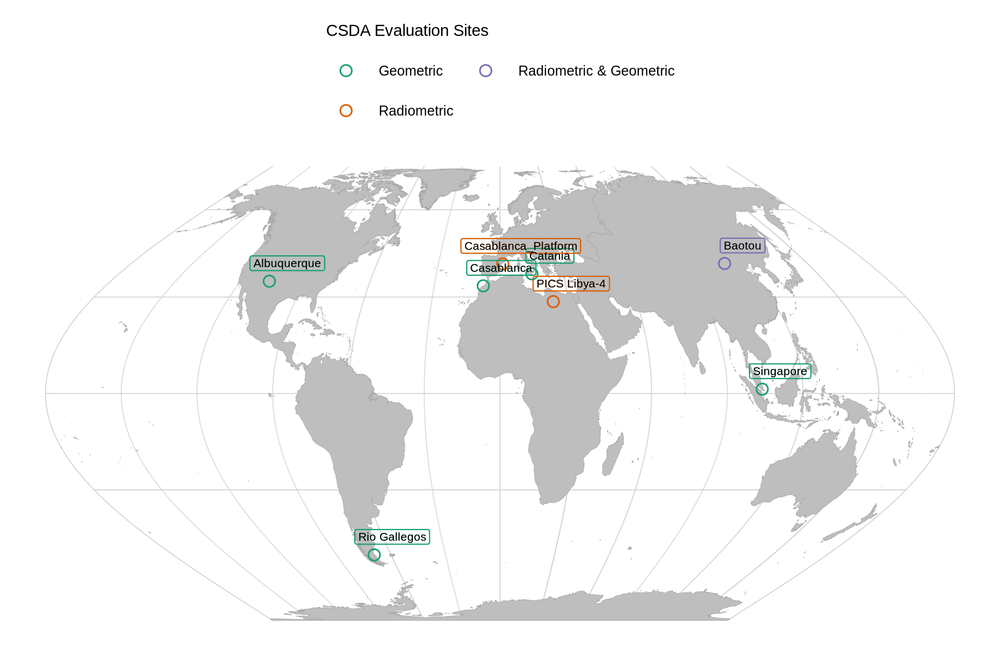

In [24]:


base_map +   # Finally add the site points
  geom_sf(data = sites_proj_subset
          , aes(color=`Evaluation.Category`), size = 2, shape=1) +
  geom_sf_label(data = sites_proj_subset, aes(label = `Site.Name`, color=`Evaluation.Category`), 
               nudge_x = 7e5, nudge_y = 7e5, size = 1.75, show.legend = FALSE) +
  geom_sf_text(data = sites_proj_subset, aes(label = `Site.Name`), 
               nudge_x = 7e5, nudge_y = 7e5, size = 1.75, show.legend = FALSE) +
    scale_color_brewer(palette = 'Dark2', name=paste0('CSDA Evaluation Sites '),
                       guide = guide_legend(
                           ncol=2,
          override.aes = list(
            size = 2,          # Point size
            label = ""         # Remove text from legend
          )
        )
                      ) 